In [1]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics.pairwise import euclidean_distances

from sklearn.feature_extraction.text import TfidfVectorizer

import plotly.express as px

import numpy as np
import pandas as pd

import sys, os
import re

#import spacy
#nlp = spacy.load('en_core_web_sm')

In [2]:
stopword_list = """a
a's
able
about
above
according
accordingly
across
actually
after
afterwards
again
against
ain't
all
allow
allows
almost
alone
along
already
also
although
always
am
among
amongst
an
and
another
any
anybody
anyhow
anyone
anything
anyway
anyways
anywhere
apart
appear
appreciate
appropriate
are
aren't
around
as
aside
ask
asking
associated
at
available
away
awfully
b
be
became
because
become
becomes
becoming
been
before
beforehand
behind
being
believe
below
beside
besides
best
better
between
beyond
both
brief
but
by
c
c'mon
c's
came
can
can't
cannot
cant
cause
causes
certain
certainly
changes
clearly
co
com
come
comes
concerning
consequently
consider
considering
contain
containing
contains
corresponding
could
couldn't
course
currently
d
definitely
described
despite
did
didn't
different
do
does
doesn't
doing
don't
done
down
downwards
during
e
each
edu
eg
eight
either
else
elsewhere
enough
entirely
especially
et
etc
even
ever
every
everybody
everyone
everything
everywhere
ex
exactly
example
except
f
far
few
fifth
first
five
followed
following
follows
for
former
formerly
forth
four
from
further
furthermore
g
get
gets
getting
given
gives
go
goes
going
gone
got
gotten
greetings
h
had
hadn't
happens
hardly
has
hasn't
have
haven't
having
he
he's
hello
help
hence
her
here
here's
hereafter
hereby
herein
hereupon
hers
herself
hi
him
himself
his
hither
hopefully
how
howbeit
however
i
i'd
i'll
i'm
i've
ie
if
ignored
immediate
in
inasmuch
inc
indeed
indicate
indicated
indicates
inner
insofar
instead
into
inward
is
isn't
it
it'd
it'll
it's
its
itself
j
just
k
keep
keeps
kept
know
knows
known
l
last
lately
later
latter
latterly
least
less
lest
let
let's
like
liked
likely
little
look
looking
looks
ltd
m
mainly
many
may
maybe
me
mean
meanwhile
merely
might
more
moreover
most
mostly
much
must
my
myself
n
name
namely
nd
near
nearly
necessary
need
needs
neither
never
nevertheless
new
next
nine
no
nobody
non
none
noone
nor
normally
not
nothing
novel
now
nowhere
o
obviously
of
off
often
oh
ok
okay
old
on
once
one
ones
only
onto
or
other
others
otherwise
ought
our
ours
ourselves
out
outside
over
overall
own
p
particular
particularly
per
perhaps
placed
please
plus
possible
presumably
probably
provides
q
que
quite
qv
r
rather
rd
re
really
reasonably
regarding
regardless
regards
relatively
respectively
right
s
said
same
saw
say
saying
says
second
secondly
see
seeing
seem
seemed
seeming
seems
seen
self
selves
sensible
sent
serious
seriously
seven
several
shall
she
should
shouldn't
since
six
so
some
somebody
somehow
someone
something
sometime
sometimes
somewhat
somewhere
soon
sorry
specified
specify
specifying
still
sub
such
sup
sure
t
t's
take
taken
tell
tends
th
than
thank
thanks
thanx
that
that's
thats
the
their
theirs
them
themselves
then
thence
there
there's
thereafter
thereby
therefore
therein
theres
thereupon
these
they
they'd
they'll
they're
they've
think
third
this
thorough
thoroughly
those
though
three
through
throughout
thru
thus
to
together
too
took
toward
towards
tried
tries
truly
try
trying
twice
two
u
un
under
unfortunately
unless
unlikely
until
unto
up
upon
us
use
used
useful
uses
using
usually
uucp
v
value
various
very
via
viz
vs
w
want
wants
was
wasn't
way
we
we'd
we'll
we're
we've
welcome
well
went
were
weren't
what
what's
whatever
when
whence
whenever
where
where's
whereafter
whereas
whereby
wherein
whereupon
wherever
whether
which
while
whither
who
who's
whoever
whole
whom
whose
why
will
willing
wish
with
within
without
won't
wonder
would
would
wouldn't
x
y
yes
yet
you
you'd
you'll
you're
you've
your
yours
yourself
yourselves
z
zero
rt
follow
unfollow
comment
review
amazon
purchase
buy""".split()

In [3]:
import json

with open("C:/Users/DKARACA/Downloads/reviews_Automotive_5.json/Automotive_5.json", "r") as f:
    lines = [json.loads(line.strip()) for line in f.readlines()]
    
df = pd.DataFrame([(e['reviewerID'], e['asin'], e['helpful'], e['reviewText'], e['overall'], e['summary']) for e in lines],
                 columns=['reviewerID', 'asin', 'helpful', 'reviewText', 'overall', 'summary']) \
.reset_index().rename(columns={'index': 'id_index'})
df['overall'] = df['overall'].astype(int)

In [19]:
texts = {}
for t in df.itertuples():
    if t.id_index % 1000 == 0:
        print(t.id_index)
    curr_text = t.reviewText
    
        
    curr_text = ' '.join(e for e in curr_text.split() if e.strip())
    curr_lemmed = [' '.join(e.lemma_.lower() for e in sent if len(e.tag_) > 0) for sent in nlp(curr_text).sents]

    curr_lemmed = ' '.join(curr_lemmed)
    
    texts[t.id_index] = curr_lemmed
    

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000


In [21]:
texts = {
    k: ''.join(i for i in v.strip() if ord(i)<128) for k,v in texts.items()
}

texts = {
    k: ' '.join(e for e in v.split() if e.isalpha()) for k,v in texts.items()
}

In [37]:
text_df = pd.DataFrame([(k, ' '.join(e for e in v.split() if e not in stopword_list + ["'",
'-',
'!',
'%',
'*',
'.',
'..',
'...',
':',
'?',
'_',
'|',
'~',
'=','16yr','1st','2nd','70th','u.s', 'u.s.', 'm.o.p.', 'ii','im','dont','cdt','c-130','bc','w/',"'ve","'s"
])) for k,v in texts.items()], columns=['id_index', 'processed_text']).drop_duplicates(subset=['processed_text']) \
.query("processed_text != ''").reset_index(drop=True)

text_df

,id_index,processed_text
0,0,set jumper cable car good good price time supp...
1,1,long cable work fine truck quality shabby side...
2,2,back update find issue build solid nice tough ...
3,3,absolutley love price set cheap booster jumper...
4,4,foot long cable set arrive retail cardboard bo...
...,...,...
20421,20468,past year give gift friend club brother report...
20422,20469,admit price item expectation unfairly high str...
20423,20470,love skull face mask make outstand rest fellow...
20424,20471,mask describe half face long protection neck g...


In [3]:
text_df = pd.read_csv("processed_tweets_1105.csv")

In [4]:
vect = TfidfVectorizer(ngram_range=(1,3), min_df=30, max_df=0.4)
matrix = vect.fit_transform(text_df['processed_text']).toarray()

text_df['filt_text'] = text_df['processed_text'].apply(lambda x: [e for e in x.split() if e in vect.vocabulary_])
text_df['filt_count'] = text_df['filt_text'].map(len)
print(len(vect.vocabulary_))

3064


In [5]:
import time

In [59]:
new_curr_scores = []
for k in range(45, 101, 5):
    clf = KMeans(n_clusters=k, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='auto')
    start_time = time.time()
    clf.fit(matrix)
    end_time = time.time()
    curr_sil = silhouette_score(matrix, clf.labels_)
    curr_cal = calinski_harabasz_score(matrix, clf.labels_)
    curr_dav = davies_bouldin_score(matrix, clf.labels_)
    curr_labels = pd.DataFrame(clf.labels_, columns=['label'])
    for g, g_df in curr_labels.groupby("label"):
        curr_dists = euclidean_distances(matrix[g_df.index.tolist()], clf.cluster_centers_[g].reshape(1, -1)).reshape(1, -1)[0]
        curr_sums = np.sum(np.square(curr_dists))
        curr_means = np.mean(curr_dists)
        new_curr_scores.append((k, curr_sil, curr_cal, curr_dav, clf.inertia_, g_df.shape[0], curr_sums, curr_means, end_time-start_time))
        print(new_curr_scores[-1])

(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 73, 47.71627867941343, 0.8010081274022994, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 3659, 3596.7595586567554, 0.9912353737110565, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 310, 269.6393639870756, 0.9316502949673009, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 182, 135.43980590756308, 0.8592999519355843, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 245, 204.19245008189148, 0.9110794697246046, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 376, 334.72031152930407, 0.9428232155154508, 677.9390254020691)
(45, 0.022928452574229086, 49.748353321821, 5.813682249209311, 18063.845557787114, 205, 164.1748104811175, 0.89220589523

(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 190, 152.66979183391112, 0.8943386099073373, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 111, 89.25856528092427, 0.8938636849270641, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 895, 857.5780638709091, 0.9787678681319628, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 112, 88.65942615015254, 0.8872063884213706, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 338, 304.02996342561653, 0.9478867719317023, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 401, 340.32892800222095, 0.9203680404772402, 705.7083959579468)
(50, 0.02393295133345219, 47.11082357747606, 5.628656291107336, 17968.256619684587, 209, 184.84196386346787, 0.9398

(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 410, 324.45726418857066, 0.887746157400343, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 533, 496.9473913771404, 0.965398345398095, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 363, 316.87797276849415, 0.9335089181513505, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 213, 172.55785893726943, 0.8982176317766667, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 528, 432.95419432706007, 0.9039662234884622, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 421, 340.28323880686173, 0.8974911230770592, 758.3279831409454)
(55, 0.021542174810269345, 44.648792211313406, 5.6284610764067775, 17886.88544688945, 254, 218.90629711

(60, 0.024697031430003673, 42.79998424464149, 5.571455697180726, 17797.216543523755, 234, 203.64162600585172, 0.9319455264102705, 813.3136601448059)
(60, 0.024697031430003673, 42.79998424464149, 5.571455697180726, 17797.216543523755, 96, 73.7346062842873, 0.8737542981580543, 813.3136601448059)
(60, 0.024697031430003673, 42.79998424464149, 5.571455697180726, 17797.216543523755, 675, 633.2689733710545, 0.968439372086671, 813.3136601448059)
(60, 0.024697031430003673, 42.79998424464149, 5.571455697180726, 17797.216543523755, 265, 233.55991596823466, 0.9380777184158272, 813.3136601448059)
(65, 0.02465707273056773, 41.142615652297984, 5.4716710192791185, 17713.201294062514, 61, 45.964358007830775, 0.8652565472436322, 880.2525789737701)
(65, 0.02465707273056773, 41.142615652297984, 5.4716710192791185, 17713.201294062514, 190, 130.04367477235297, 0.8233412217807112, 880.2525789737701)
(65, 0.02465707273056773, 41.142615652297984, 5.4716710192791185, 17713.201294062514, 222, 177.9869022285663, 

(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 628, 602.7389124677507, 0.9796178901831759, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 563, 534.6843665776087, 0.9744278313700273, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 231, 165.57962668608582, 0.8420566070177814, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 473, 386.8439032288751, 0.9029028076111334, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 396, 312.37625681675183, 0.8862497342350875, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 436, 399.9249779986169, 0.9575002036814865, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 370, 263.61426368001935, 0.839777607314

(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 175, 149.14333325464034, 0.921861434117182, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 154, 123.35738510142185, 0.8932733118684196, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 218, 178.96446621695426, 0.9039541463964458, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 78, 58.865601926520284, 0.866912159467364, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 101, 83.84000699487876, 0.9098686459318803, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 153, 125.23937479324478, 0.9028559572617266, 948.9270904064178)
(70, 0.02445487001740583, 39.16970698174343, 5.447339223689858, 17659.25290503309, 320, 285.4124632188882, 0.9438265268877

(75, 0.02693300301860835, 37.70440036118147, 5.300576914208144, 17592.038292224144, 227, 184.16252077372116, 0.8986138507700576, 984.9936974048615)
(75, 0.02693300301860835, 37.70440036118147, 5.300576914208144, 17592.038292224144, 230, 204.80939255807363, 0.9431879802988835, 984.9936974048615)
(75, 0.02693300301860835, 37.70440036118147, 5.300576914208144, 17592.038292224144, 300, 276.8283294633066, 0.9602707445488237, 984.9936974048615)
(75, 0.02693300301860835, 37.70440036118147, 5.300576914208144, 17592.038292224144, 79, 62.453501270740674, 0.8866813229282531, 984.9936974048615)
(75, 0.02693300301860835, 37.70440036118147, 5.300576914208144, 17592.038292224144, 158, 141.08744645500298, 0.9444427046013781, 984.9936974048615)
(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 152, 131.1863149164255, 0.9278639944874284, 1031.4662294387817)
(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 420, 390.67962094326947, 0.9

(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 225, 190.2092262720543, 0.9181578193722854, 1031.4662294387817)
(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 77, 57.01152569351759, 0.8577810253586361, 1031.4662294387817)
(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 148, 118.45152228584692, 0.8928117168252637, 1031.4662294387817)
(80, 0.02422208483966728, 36.127536723130774, 5.282562428428098, 17543.026975758443, 157, 127.7036653429445, 0.9001584781743643, 1031.4662294387817)
(85, 0.024847403874400074, 35.07512115242883, 5.348005896466338, 17473.015387494448, 171, 136.4433459127925, 0.8911747139991852, 1092.7805054187775)
(85, 0.024847403874400074, 35.07512115242883, 5.348005896466338, 17473.015387494448, 361, 304.9795471801476, 0.9180850350693289, 1092.7805054187775)
(85, 0.024847403874400074, 35.07512115242883, 5.348005896466338, 17473.015387494448, 134, 111.187662536274

(85, 0.024847403874400074, 35.07512115242883, 5.348005896466338, 17473.015387494448, 216, 186.26367434268292, 0.9274592707507012, 1092.7805054187775)
(85, 0.024847403874400074, 35.07512115242883, 5.348005896466338, 17473.015387494448, 195, 165.89133839272966, 0.9215397049228509, 1092.7805054187775)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 539, 507.6404201028164, 0.9703397303330086, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 72, 52.05751973348315, 0.8452060119048789, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 129, 105.45573156226365, 0.9027548662784374, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 130, 108.00845627528912, 0.9099958889465434, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 195, 169.3102959159986

(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 100, 81.05034025720008, 0.8989881238237604, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 35, 22.19271791970028, 0.7898628435103999, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 69, 44.15310603594547, 0.7922234624968465, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 379, 305.4803168143046, 0.8959639940807087, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 149, 127.93889068742259, 0.9254913383196501, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 242, 198.508105494189, 0.903902525344524, 1151.325159072876)
(90, 0.025239561746097837, 34.03799266824418, 5.154268970082452, 17410.351812968885, 141, 118.45380535936378, 0.915

(95, 0.025325628540669366, 33.1237365718935, 5.172256846773941, 17347.233395582112, 511, 486.72345334875786, 0.9758029526333579, 1214.5573217868805)
(95, 0.025325628540669366, 33.1237365718935, 5.172256846773941, 17347.233395582112, 401, 351.14378500058706, 0.934896491260612, 1214.5573217868805)
(95, 0.025325628540669366, 33.1237365718935, 5.172256846773941, 17347.233395582112, 143, 113.67849595403848, 0.8898089937841438, 1214.5573217868805)
(95, 0.025325628540669366, 33.1237365718935, 5.172256846773941, 17347.233395582112, 72, 46.75112324273084, 0.7983434388611997, 1214.5573217868805)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 145, 123.14265077329961, 0.9201152939302866, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 113, 93.91484780025158, 0.9098169470109352, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 148, 124.51080674

(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 134, 107.87249406561361, 0.8952687638184273, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 186, 160.2021029355883, 0.9268966506911023, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 94, 77.18359294842459, 0.9048073273722375, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 88, 68.91926591972124, 0.8816448064759974, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 325, 269.85784115160135, 0.9099014989435871, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 133, 111.44548376935569, 0.9139111568329904, 1392.8191492557526)
(100, 0.026427840504236574, 32.111641354212324, 5.147201854679999, 17298.385975033525, 216, 1

In [53]:
#scores_df = pd.DataFrame(curr_scores + new_curr_scores, columns=['k', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'inertia', 'cluster_size', 'cluster_sum_dist', 'cluster_mean_dist','time'])
scores_df = pd.read_csv("kmeans_scores_df.csv")
fig = px.line(scores_df[['k','silhouette','calinski_harabasz','davies_bouldin','inertia']].drop_duplicates(),
       x='k', y=['silhouette','calinski_harabasz','davies_bouldin','inertia'], title='Reviews Dataset k vs Evaluation Metrics - K-Means')
fig.update_yaxes(title='Score')
fig.update_xaxes(title='k')

In [6]:
gmm = GaussianMixture(n_components=50, init_params='kmeans', n_init=1, max_iter=300)
gmm.fit(matrix)

GaussianMixture(max_iter=300, n_components=50)

In [7]:
gmm_probs = gmm.predict_proba(matrix)

In [8]:
gmm_preds = gmm.predict(matrix)

In [12]:
pd.concat([pd.DataFrame(gmm_preds, columns=['gmm_label']), text_df[['id_index']]], axis=1).to_csv("reviews_gmm_labels.csv")

In [7]:
tsne = TSNE(n_components=2, random_state=42)
tsne_coords = pd.DataFrame(tsne.fit_transform(matrix), columns=['x','y'])

C:\Users\DKARACA\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\DKARACA\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [11]:
pd.concat([text_df[['id_index','cluster_label']], tsne_coords], axis=1).to_csv("reviews_tsne_coords.csv")

In [61]:
clf = KMeans(n_clusters=75, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='auto')
clf.fit(matrix)

KMeans(n_clusters=75, n_init=50, random_state=42)

In [17]:
id2term = {v:k for k,v in vect.vocabulary_.items()}
#tfidf_df = pd.DataFrame(matrix, columns=[id2term[i] for i in range(len(vect.vocabulary_))])
#tfidf_df['clust_label'] = clf.labels_

#tfidf_df = tfidf_df.groupby("clust_label").agg(dict([(word, 'mean') for word in vect.vocabulary_.keys()])).reset_index()
#tfidf_df.head()

In [63]:
clust_sums = {}
for index,row in tfidf_df.iterrows():
    curr = [(word, row[word]) for word in vect.vocabulary_.keys()]
    curr = sorted(curr, key=lambda x: x[1], reverse=True)[:20]
    clust_sums[row['clust_label']] = curr

In [64]:
clust_rep = pd.DataFrame(clf.labels_, columns=['cluster_label']).reset_index().groupby("cluster_label").agg({'index': 'count'}).reset_index()
clust_rep['summary'] = clust_rep['cluster_label'].map(clust_sums)

clust_rep.to_csv("cluster_summaries.csv")

In [67]:
text_df['cluster_label'] = clf.labels_

text_df[['id_index','processed_text','filt_count','cluster_label']].to_csv("reviews_kmeans_assignments.csv")

In [22]:
plot_df = pd.read_csv("reviews_tsne_coords.csv").merge(pd.read_csv("reviews_gmm_labels.csv"), on='id_index')
px.scatter(plot_df, x='x', y='y', color='cluster_label', title='K-Means Clusters - K=75')

In [21]:
px.scatter(plot_df, x='x', y='y', color='gmm_label', title='GMM Clusters - K=50')

In [6]:
from sklearn.decomposition import PCA, FastICA
from sklearn.random_projection import GaussianRandomProjection, SparseRandomProjection
from sklearn.cluster import FeatureAgglomeration
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, entropy
from sklearn.manifold import TSNE


In [23]:
pca = PCA(n_components=1000)

pca.fit(matrix)

PCA(n_components=1000)

In [24]:
pca_proj = pca.transform(matrix)
pca_proj.shape

(20426, 1000)

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\1265443330.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Distribution of Singular Values')]

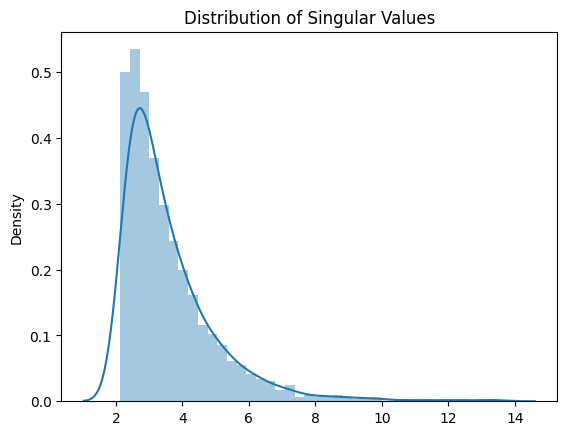

In [54]:
sns.distplot(pca.singular_values_).set(title='Distribution of Singular Values')

In [50]:
fig = px.line(np.cumsum(pca.explained_variance_ratio_), title='Explained Variance vs Number of Principal Components')
fig.update_yaxes(title="Explained Variance")
fig.update_xaxes(title="Number of Principal Components Used")
fig.update_layout(showlegend=False)

In [18]:
pc_df = pd.DataFrame(pca.components_, columns=[id2term[i] for i in range(len(vect.vocabulary_))]).T
pc_descs = {}
for col in pc_df.columns.values:
    curr = sorted(list(zip(pc_df.index.tolist(), pc_df[col].tolist())), key=lambda x: x[1], reverse=True)[:20]
    pc_descs[col] = curr

[('battery', 0.4083915585315925), ('charge', 0.17710638222708538), ('light', 0.14451557472146834), ('charger', 0.1281300568835317), ('filter', 0.11637542967620167), ('plug', 0.10439569509399493), ('tender', 0.09440533594686723), ('bulb', 0.09400115329258484), ('battery tender', 0.07879854194923838), ('power', 0.07675643940805117), ('fit', 0.0748093638100988), ('unit', 0.07048042117871976), ('oil', 0.07031480439476788), ('bright', 0.06041900819813549), ('replace', 0.052281303618048676), ('motorcycle', 0.047774932224540115), ('trailer', 0.04726032378846299), ('wire', 0.042878135190355784), ('connect', 0.04262111821547354), ('install', 0.04177979756716695)]
-0.40 While I've never seen a car care kit that included everything to take care of your car, this one comes close.  It will really get you started on the right track with quality, beneficial products.  I love my cars and am passionate about taking care of them.  I use some of these products daily, but I've tried just about everything 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




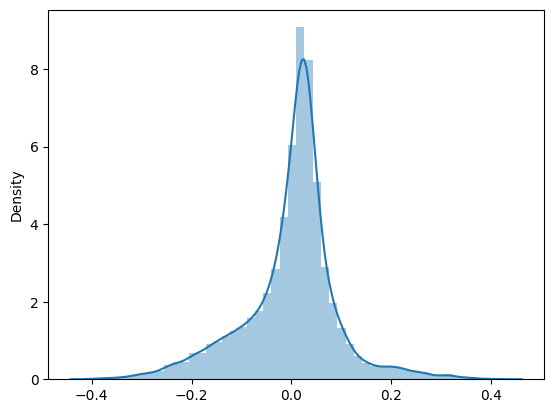

[('filter', 0.6227481745439291), ('oil', 0.4101997583207126), ('oil filter', 0.1562627627553346), ('change', 0.14859166699851734), ('fit', 0.08060986883011584), ('oil change', 0.07976702030863417), ('air', 0.06727180732304179), ('air filter', 0.061692365911793993), ('change oil', 0.05502019819983739), ('engine', 0.052812614566142314), ('fram', 0.05167208293805485), ('mile', 0.05015975142807233), ('oem', 0.04799546292201018), ('wrench', 0.04736985327663338), ('price', 0.04404993618147737), ('quality', 0.04005080091695958), ('synthetic', 0.03707362683082049), ('cabin', 0.03661559724754887), ('mobil', 0.03417182437719591), ('good', 0.028637616925550724)]
-0.38 This is a must-have if you have a wall charger as the length is great and if your battery is not close to the charger. I use mine for charging my RV truck battery and the house side battery at the same time, as I have a Battery Tender 'Y' for charging more than 1 battery. This is heavy-duty and works for both my Battery Tender plus 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




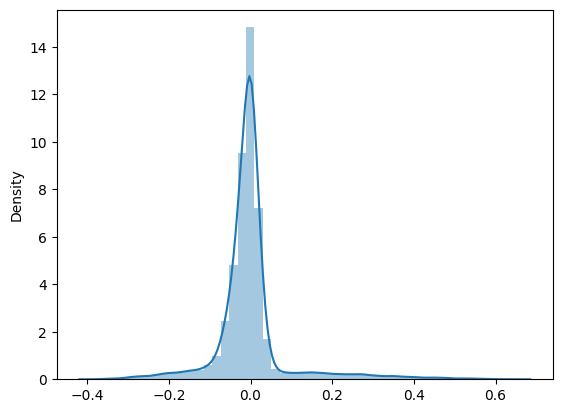

[('blade', 0.44371767713317434), ('wiper', 0.4084592381628552), ('wiper blade', 0.17700060038549725), ('windshield', 0.1276474631830633), ('install', 0.11335741662826923), ('bulb', 0.10012493554497351), ('fit', 0.09566467172289501), ('rain', 0.08917217596949314), ('easy install', 0.0872100273991326), ('light', 0.08068695398513209), ('bosch', 0.07123553353633034), ('easy', 0.07093746945526505), ('bright', 0.06110475774592279), ('replace', 0.0576863253434658), ('instal', 0.055594217524553964), ('streak', 0.05112090771663783), ('side', 0.04999236424146564), ('work', 0.0478010053600477), ('snow', 0.04535635229640727), ('arm', 0.045097390752195904)]
-0.32 This is a must-have if you have a wall charger as the length is great and if your battery is not close to the charger. I use mine for charging my RV truck battery and the house side battery at the same time, as I have a Battery Tender 'Y' for charging more than 1 battery. This is heavy-duty and works for both my Battery Tender plus and my 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




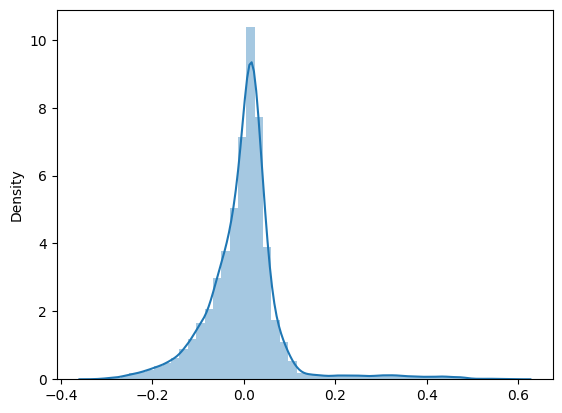

[('blade', 0.4330949633909459), ('wiper', 0.39131771680347976), ('battery', 0.3573488704276549), ('filter', 0.1804915928265317), ('car', 0.17493788336394622), ('wiper blade', 0.17235686146327486), ('charge', 0.15133500361736432), ('windshield', 0.1245788570890039), ('oil', 0.11898884310265417), ('charger', 0.11861258562719122), ('rain', 0.0936201900499004), ('tender', 0.08865945724296172), ('bosch', 0.07850012028202218), ('battery tender', 0.07544107031003734), ('streak', 0.06450621584044999), ('year', 0.06031904232231546), ('towel', 0.06019695555671738), ('wash', 0.059365649720505974), ('wax', 0.05685455581279399), ('leave', 0.049105099330112895)]
-0.29 Maybe other people will have different results, but I was extremely disappointed. I bought these bulbs to replace the fairly dim bulbs in the dash of my 1996 Ford pickup, which has 194 style bulbs.  I had already replaced my dash bulbs with the &#34;high output&#34; filament type 194 bulbs. They still weren't bright enough for me, so I

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




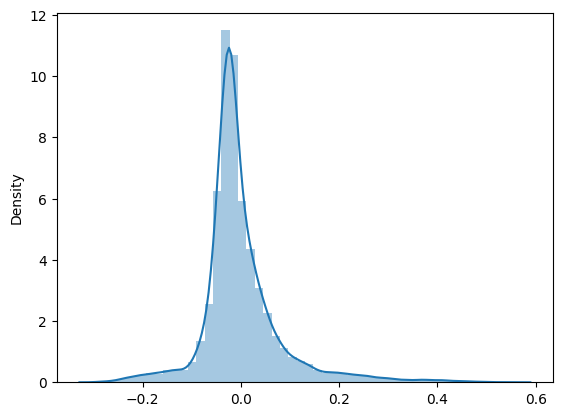

[('light', 0.473510231336601), ('bulb', 0.44889904224171123), ('bright', 0.26775470758920905), ('car', 0.21846149783026542), ('filter', 0.14560225073078156), ('wax', 0.12799099155971946), ('white', 0.12247312462785495), ('blade', 0.09967057908392467), ('replace', 0.09669590589640246), ('wiper', 0.08390250990650167), ('led', 0.08226355314795473), ('oil', 0.08217720144938731), ('wash', 0.07855864760285314), ('towel', 0.07584654566925322), ('headlight', 0.07030949071118685), ('stock', 0.06813380692503955), ('color', 0.06610533940637084), ('lead', 0.06559907952330978), ('blue', 0.06254814997437691), ('hid', 0.05884096509855646)]
-0.25 Work's great for my trailer.
-0.25 work great for my John Deere X500
0.52 These bulbs are noticeably brighter than the OEM bulbs (this is compared to 3 year old bulbs). They definitely put off more white light, and have more light at the edges of the cone than OEM bulbs.
0.52 Attracted to their low price, I tried substituting these LED bulbs for the filament 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




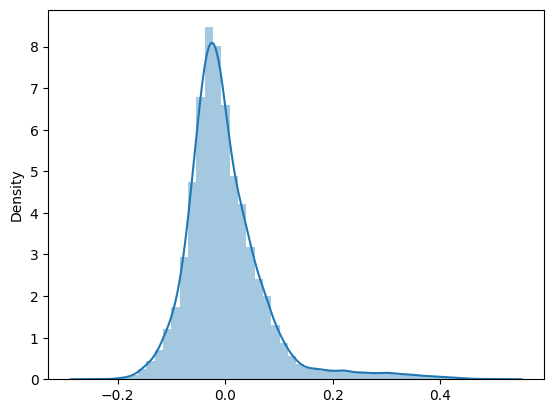

[('great', 0.5733559500502255), ('work', 0.4616458076540161), ('work great', 0.4331607220973861), ('product', 0.08174584237654957), ('bulb', 0.08162352163230284), ('great product', 0.07676748797516868), ('filter', 0.07274651738666502), ('oil', 0.0637122007257874), ('light', 0.06091228586867844), ('great price', 0.05736053682050242), ('install', 0.05257105057897566), ('easy install', 0.049418659316212595), ('product work', 0.04476403324969539), ('price', 0.0432639662292343), ('bright', 0.03830221647819646), ('work fine', 0.03724642180029354), ('recommend', 0.0347068543416514), ('oil filter', 0.030436895000495748), ('battery', 0.029791863577720946), ('great easy', 0.029771422834469735)]
-0.28 .A good tire gauge is easy to line up at the correct angle to the valve stem. You can line it up visually before you press it on. You lose very little air while checking the pressure. If the pressure was already correct, you do not have to add back 1-2 PSI that you lost with the gauge.The nose of a 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




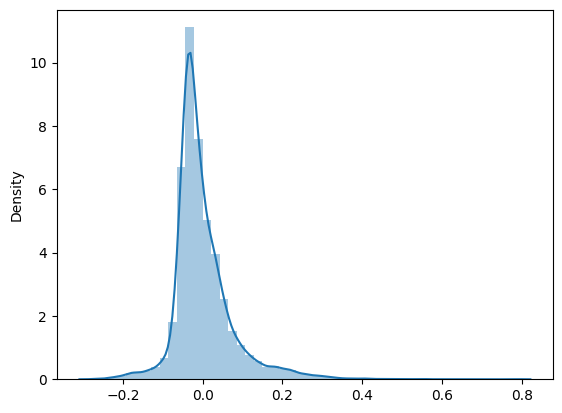

[('towel', 0.43836089019501606), ('water', 0.23011903176408643), ('dry', 0.1744720075408236), ('wash', 0.1426239105370321), ('microfiber', 0.12391980331636047), ('hose', 0.09158093470508155), ('fit', 0.08366801626477283), ('microfiber towel', 0.07823975012916029), ('soft', 0.06833483797810848), ('rv', 0.06677055215619054), ('clean', 0.06196799304577899), ('dry car', 0.05575635471522057), ('tank', 0.05481035763621424), ('mitt', 0.05355608199633158), ('trailer', 0.052125742006982535), ('cloth', 0.04829445882914167), ('small', 0.04813874165285417), ('large', 0.04789595039161822), ('hold', 0.047342355552962054), ('wring', 0.04485080559554026)]
-0.43 have not in stalled this product yet but looks like it will do exactly what i need it to do.
-0.34 I enjoy detailing my car.  Although I used many tire shine products, I wanted to find one that had the right balance between shind and protection.  Many of the tire shine products weaken the tire walls or interact with the rubber.  Others have &#3

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




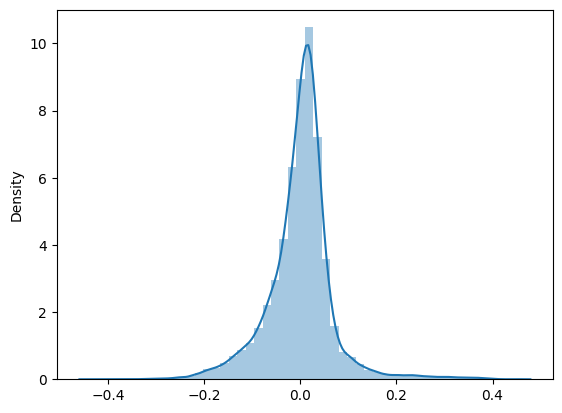

[('tire', 0.4750849757144287), ('work', 0.2513889678988999), ('gauge', 0.20722929308982566), ('oil', 0.17424047999148082), ('work great', 0.15933013945592317), ('pressure', 0.14008395035164195), ('car', 0.11452805212095724), ('towel', 0.09874921696783197), ('great', 0.09043059663112339), ('air', 0.08932918997742709), ('blade', 0.08029375353058704), ('change', 0.07981044516089954), ('light', 0.07385207366126036), ('wheel', 0.06983507280454358), ('valve', 0.06884807527525072), ('compressor', 0.06847758585371776), ('pump', 0.06494990294061878), ('bulb', 0.06086443262047465), ('water', 0.059890782064746545), ('tire pressure', 0.059484972846530766)]
-0.39 Easy to install, and fits well. Wipes the windscreen very well.
-0.36 This filter was easy to install and fit well. Even a caveman could do it. Much cheaper than having a dealer do it.
0.40 The low profile tires common today require much closer pressure monitoring. Maintaining accurate tire pressure is even more critical with these tires. 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




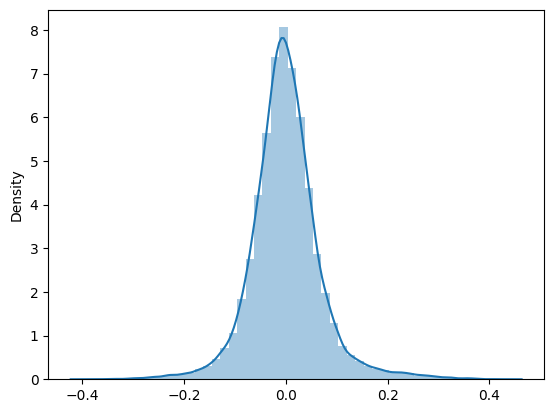

[('easy', 0.38368290209422234), ('tire', 0.3313021701199095), ('filter', 0.27647840995430595), ('install', 0.23924348090065123), ('easy install', 0.20778353362849447), ('wax', 0.20626353227858515), ('car', 0.18949995123966465), ('gauge', 0.14414400159773955), ('wash', 0.11324113820172219), ('air', 0.11029047059748004), ('great', 0.09967490606142587), ('pressure', 0.09153421882471924), ('light', 0.08585810736853024), ('work great', 0.08406059771508449), ('shine', 0.05664676406695238), ('make easy', 0.047831698723690974), ('fit', 0.04648738919281139), ('dry', 0.044685041460800046), ('accurate', 0.0446287173128709), ('jeep', 0.04443635168468738)]
-0.33 I have been useing this product for over 30 years on all my leather products and it is the best product on the market !! Amazon has the best price over all. You cant go wrong with Lexol and Amazon !!!
-0.33 have not in stalled this product yet but looks like it will do exactly what i need it to do.
0.37 This filter was easy to install and f

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




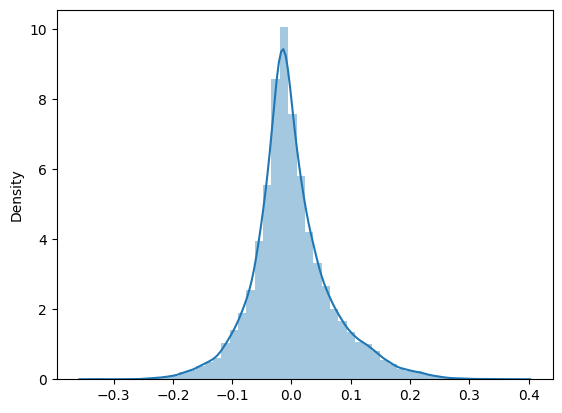

[('oil', 0.3757089590300759), ('wax', 0.24881815327880527), ('change', 0.1470151955090187), ('car', 0.14023648071508776), ('plug', 0.11140003656950512), ('engine', 0.09661449286867001), ('oil change', 0.09373475529587097), ('jack', 0.0735963224444286), ('drain', 0.07184989307459201), ('change oil', 0.06552230292423764), ('paint', 0.06365814850452313), ('clay', 0.06256935571965797), ('fluid', 0.06177126857410206), ('put', 0.06008661862617363), ('run', 0.05832223456163274), ('trailer', 0.05711579514142044), ('easy', 0.05660383297937598), ('time', 0.05396529208518021), ('polish', 0.053078951627330014), ('pump', 0.050859716651900075)]
-0.32 this product is good if you didn't know that by now, you must be picky or new at filters. WOOT
-0.30 Good filter which is better than Fram, Stp or other lower end filters out there.  There are good comprehensive filter reviews at [...].  I am not sure how well the additional filtration actually helps but it's only a dollar more for the pureone product.


C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




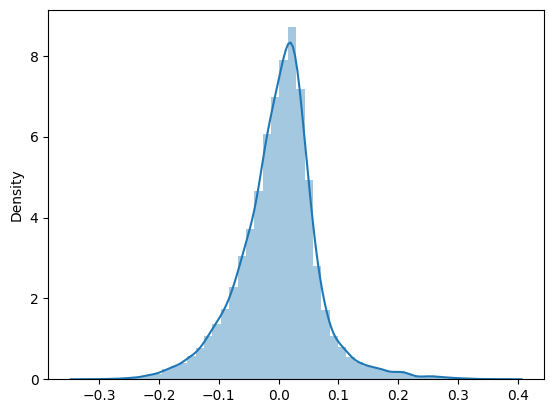

[('oil', 0.3753301763651452), ('easy', 0.339769875388579), ('towel', 0.3251372319633896), ('install', 0.24778044599409801), ('easy install', 0.22874477736494397), ('change', 0.1343770267853236), ('great', 0.11844447310871398), ('price', 0.11317153126624115), ('dry', 0.10790676158387655), ('recommend', 0.10426811049170893), ('quality', 0.09800820096869917), ('product', 0.09566632653119939), ('oil change', 0.0904603839214673), ('tire', 0.0896238915301349), ('microfiber', 0.08904436706310392), ('good', 0.08094731175316107), ('highly', 0.06574289314638372), ('highly recommend', 0.06539882499663574), ('gauge', 0.06359880125165117), ('microfiber towel', 0.06328150315157006)]
-0.29 Didn't want to ham fist it on there since the last filter was a pain to get off. Fit on my EJ255, It's a filter what more is there to say
-0.24 I only use K&N filters in my Altima. I cannot say if its better than another brand or does a better job than another but it works so....
0.34 Looked great and is easy to in

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




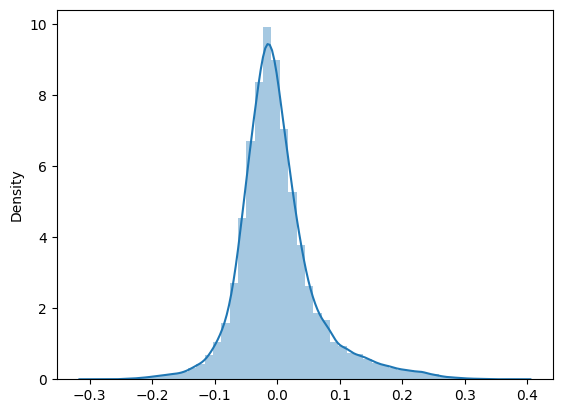

[('clean', 0.36476212694251), ('wheel', 0.3489756806926469), ('leather', 0.32322101241862505), ('brush', 0.191599817023538), ('easy', 0.12771846250737254), ('cleaner', 0.12763686641266808), ('product', 0.10009055467471707), ('install', 0.09901054805456733), ('spray', 0.08840110155596793), ('easy install', 0.08302149351327479), ('seat', 0.08121859033490965), ('light', 0.0764309929839117), ('dust', 0.07046195267273538), ('conditioner', 0.07031282221594187), ('brake', 0.06794129176295319), ('smell', 0.06215451580839507), ('interior', 0.06149280770119148), ('battery', 0.05976605716294543), ('oil', 0.05602654076701506), ('dirt', 0.05579734184654567)]
-0.34 Very good! if you don't have one and you are thinking of getting one, just get it!
-0.31 Good quality and fits.
0.40 Does a great job at cleaning the wheels... Yes you still need to use a brush/sponge/wand whatever to &#34;touch&#34; the dirt, however the wheels do seem to spray clean easily for awhile after being cleaned with this.
0.40 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




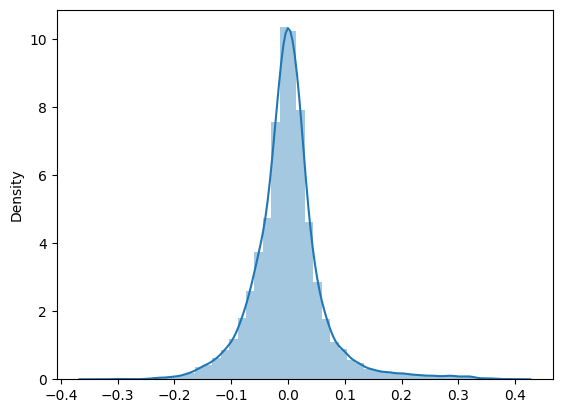

[('product', 0.3790893990813635), ('water', 0.3096606905747152), ('hose', 0.22383365869005242), ('tank', 0.16754804084172012), ('rv', 0.1653537849342724), ('filter', 0.11855325901537885), ('towel', 0.11016652401749909), ('air', 0.07845758541326635), ('dry', 0.07300136598213923), ('great product', 0.07004567943562838), ('recommend', 0.06614306630244512), ('sewer', 0.06558665202381331), ('pressure', 0.06337511522288106), ('time', 0.05680780330773486), ('valve', 0.05660763862782982), ('leak', 0.05379192842613806), ('sewer hose', 0.048625559147019846), ('water tank', 0.04781522599711498), ('product work', 0.04643775008762494), ('recommend product', 0.045991852355776824)]
-0.36 I bought this along with the wheel brush to make cleaning my wheels easier.  I get tired of all the cracks and crevices in the wheels where brake dust and road grime like to hid.  This brush does a great job with just car wash.  I did not use and wheel cleaner and it did a great job.I took one star off because on the

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




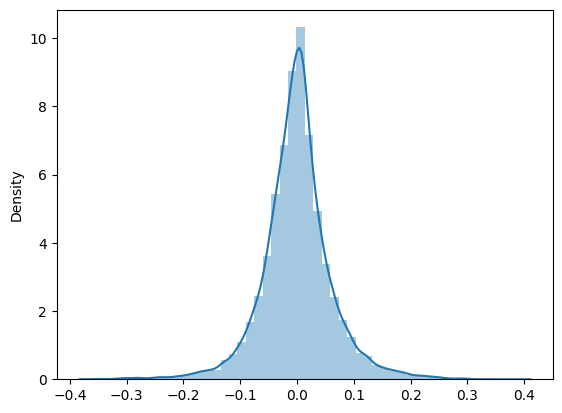

[('fit', 0.4398429958190448), ('car', 0.3776801035936838), ('product', 0.21902582341365365), ('great', 0.13196697929563705), ('perfectly', 0.10949367442178273), ('wash', 0.10166173391170696), ('recommend', 0.09432757652135931), ('perfect', 0.09084881024737587), ('cover', 0.08846128536472807), ('fit perfectly', 0.08075071156008289), ('plug', 0.07260961922680106), ('great product', 0.06988181192739913), ('jeep', 0.06727636721654254), ('jack', 0.0624330650577056), ('highly', 0.059175591574651416), ('highly recommend', 0.05899004779441666), ('car wash', 0.0529322945434824), ('tire', 0.05210117994788488), ('hitch', 0.05043318724118424), ('seat', 0.049953640092892715)]
-0.31 Very good! if you don't have one and you are thinking of getting one, just get it!
-0.23 It suds up good, i used this in an attached sprayer bottle on my hose and it foamed up good spraying it out. Noticed after rinsing it immediately started beading water off which is a good sign. Only time will tell on how long it will

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




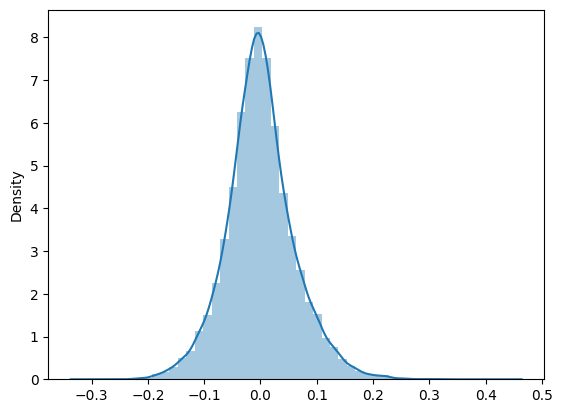

[('car', 0.34934961622701044), ('work', 0.2614122026392462), ('good', 0.24146742000691843), ('plug', 0.17528544393049525), ('leather', 0.1738454195182404), ('easy', 0.16265485907553665), ('install', 0.1485289819838733), ('easy install', 0.12085640545720046), ('code', 0.11668923698248505), ('tool', 0.10726358922176389), ('light', 0.07622730369300766), ('engine', 0.07120899141321092), ('power', 0.06523736402069973), ('work good', 0.06393671435031337), ('smell', 0.06024943297713031), ('spark', 0.05985419779866536), ('air', 0.0595277455317226), ('read', 0.05845269809371934), ('clean', 0.056637651052034554), ('spark plug', 0.05436361280856596)]
-0.25 As always, anything with the name Battery Tender on it is great.  I have two on each bike I own.  Always a great product with a great name.  I would highly recommend this to anyone that needs to keep a battery charged, weather a motorcycle or an  RV.
-0.23 I'm no expert on wax, but this Meguiar's wax was recommended on a GMC Terrain forum. I bo

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




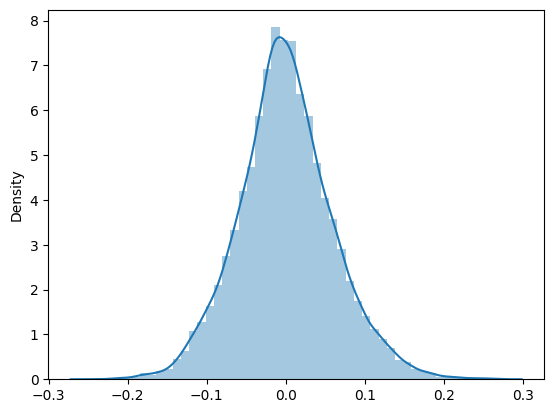

[('leather', 0.39072049422017774), ('towel', 0.245659103120543), ('work', 0.22351137095992063), ('seat', 0.11566751465037675), ('wax', 0.10782126695284219), ('apply', 0.10108555889794997), ('pad', 0.0967997349687421), ('microfiber', 0.08810939017671673), ('conditioner', 0.08667236618673087), ('fit', 0.08245910441729824), ('tire', 0.08220336137312229), ('fine', 0.07863521578967016), ('dry', 0.07684515265619757), ('polish', 0.06795011994651054), ('work fine', 0.05884553647383684), ('microfiber towel', 0.05830313797609836), ('oil', 0.0574456739047305), ('lexol', 0.05668777731077841), ('nice', 0.05320495661175488), ('cloth', 0.05238266051471009)]
-0.30 I use these every time I wash one of my cars with enisett or sonax wheel cleaner and the wheels look brand new every time. These are great for cleaning inside the wheel for that professional detailing look. Now it stands out when I look at a just washed car and see all that brake dust inside the wheel because someone only washed the outside 

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




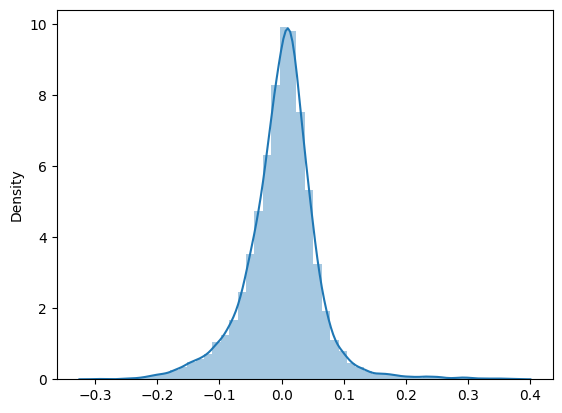

[('trailer', 0.28977843516930457), ('jack', 0.2767099481608066), ('product', 0.23232117710539443), ('towel', 0.2114394724593934), ('work', 0.20012310347041767), ('wheel', 0.16407509277259683), ('light', 0.12202551799909214), ('filter', 0.11669952603091135), ('make', 0.10383875945006302), ('recommend', 0.0893444315737656), ('level', 0.08841775518997196), ('travel', 0.07626855132788722), ('travel trailer', 0.07339505784357032), ('set', 0.06070518467013134), ('chock', 0.05876649720500112), ('drill', 0.05835440064157986), ('brake', 0.055090052891182704), ('stand', 0.05451918423466894), ('pad', 0.05420685198316049), ('power', 0.052925472467475206)]
-0.28 just  recived  these  prefect  fit would  tell any one in of these  to buy  these you  wont  besorry  you did
-0.27 This would be a great starter-set for new RV owners. Emptying the black and gray tanks on an RV can be a little daunting for new owners, and knowing which products to buy is even harder. This set gives you just about everythin

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




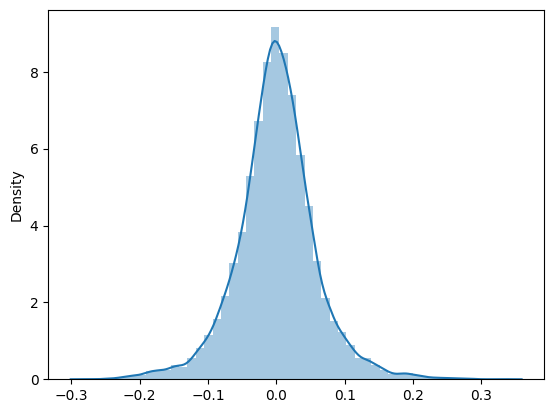

[('leather', 0.44829128991838113), ('trailer', 0.34533737508195), ('jack', 0.33670027002099706), ('car', 0.17187639807847455), ('great', 0.13780455144093787), ('price', 0.10874901936738093), ('level', 0.10565345240904112), ('travel', 0.1039969024914224), ('seat', 0.10161047133442493), ('travel trailer', 0.10020767556912759), ('conditioner', 0.09933399404512432), ('smell', 0.07562521530324622), ('stand', 0.07266077716435779), ('make', 0.07214507454765832), ('recommend', 0.06753763013897336), ('set', 0.06591020230414121), ('lexol', 0.06580218363336465), ('rv', 0.062416735218601437), ('highly', 0.056009565195296755), ('jack stand', 0.05536178660006233)]
-0.25 just  recived  these  prefect  fit would  tell any one in of these  to buy  these you  wont  besorry  you did
-0.24 I haven't used this product yet but expect it will do a better job than the toothbrush I was using!  I use it with two other effective products available on Amazon, Sonax 230200-755 Wheel Cleaner and Mothers Wheel Brush

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




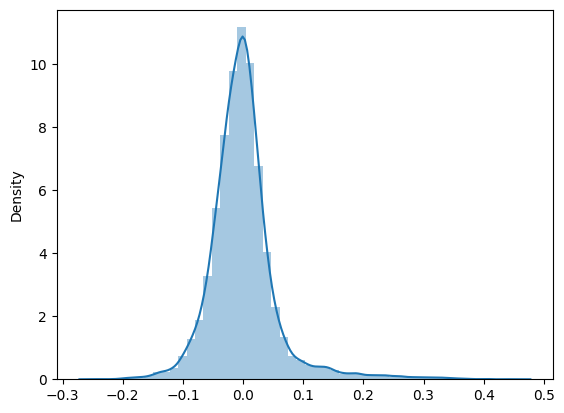

[('work', 0.32177599743977237), ('good', 0.30395325553157326), ('fit', 0.2875330607441056), ('trailer', 0.24202849891607675), ('oil', 0.1938617268126861), ('water', 0.16917521176676178), ('rv', 0.12721544185435898), ('product', 0.1048563423648819), ('light', 0.10473631473975124), ('car', 0.10369701851439633), ('battery', 0.10102741455915791), ('fine', 0.09442634131996541), ('perfectly', 0.09288908699981192), ('tire', 0.09057484296944988), ('work fine', 0.08393453411236669), ('work good', 0.08265278770776538), ('wash', 0.08037237078901556), ('travel', 0.07519069231468055), ('jack', 0.07416553710148298), ('travel trailer', 0.07339559018146274)]
-0.28 I have 2012 expedition,  I recommend everyone to buy this tool. Buy it, get it to the guys replacing your spark plugs to use it. It is great tool to avoid breaking the plug and install it successfully. Great product.
-0.28 Great ......
0.30 I got these for my Amana stovetop the worked perfectThe ones that Amana had were over $4.00 eaGreat bu

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




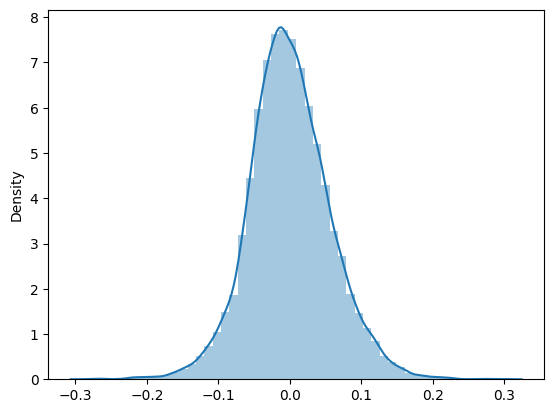

[('light', 0.5212350569445742), ('great', 0.23318641542627142), ('good', 0.18680431648712548), ('plug', 0.16249405572414818), ('power', 0.1150489832885552), ('trailer', 0.09168981215329274), ('wax', 0.08355736725562818), ('water', 0.0825318389577963), ('wire', 0.07129833176633225), ('work great', 0.07089848384009674), ('mount', 0.06922764883228673), ('hose', 0.06836257580660396), ('blade', 0.0622241842466487), ('unit', 0.06215873272380114), ('filter', 0.061519208098824885), ('oil', 0.05929948251900331), ('switch', 0.05878499005103254), ('cover', 0.05871953985732318), ('great product', 0.058251297019380206), ('small', 0.05797284190224434)]
-0.38 I noticed the extra field of vision from these bulbs . I used them in my Subaru replacing both bulbs as one was out, they were GE bulbs.  They are brighter then the old bulbs.
-0.37 I've changed the headlight on my motorcycle to HID, but I have several motorcycle-riding acquaintances who still use bulbs; one in particular was complaining about t

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




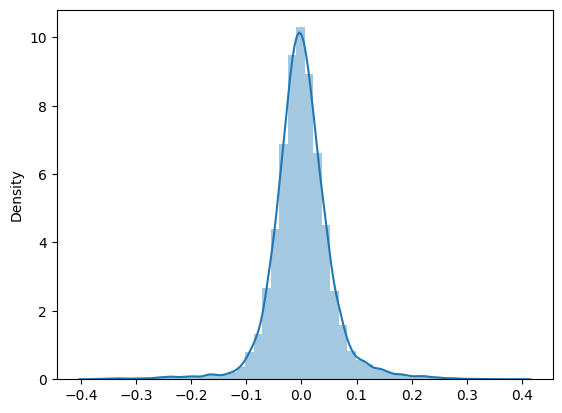

[('recommend', 0.4374894848934263), ('plug', 0.3519136569718339), ('highly', 0.32497735524214416), ('highly recommend', 0.3199521786134729), ('wax', 0.20030860325534253), ('spark', 0.1387529759795645), ('wheel', 0.1265316359261033), ('spark plug', 0.12471372773557303), ('leather', 0.11554210442940277), ('recommend product', 0.07443467798562181), ('clean', 0.07038246466439266), ('perfectly', 0.06062942800088877), ('fit', 0.05602240531978806), ('pad', 0.054320350344409504), ('trailer', 0.05399689325546592), ('highly recommend product', 0.05335636283168598), ('tool', 0.05174691739552172), ('power', 0.050665942387327606), ('engine', 0.0452996778611478), ('polish', 0.04405687332143702)]
-0.25 These are well made. I got two to use around. These look like they will last? Just takes time.  SW
-0.21 Well made
0.39 oh ya this is a nice one, it looks great on my gun.  I highly recommend this seperator to anyone,
0.46 This is a very good meter and gets used more than you would think. Wouldn't want

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_25640\3722672119.py:12: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




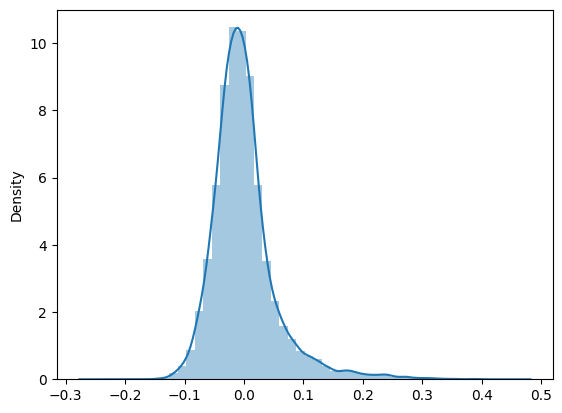

In [21]:
text_dict = dict(zip(df['id_index'], df['reviewText']))
id2textId = dict(enumerate(text_df['id_index'].tolist()))
for j in range(pca_proj.shape[1]):
    print(pc_descs[j])
    curr = pca_proj[:, j].reshape(1, -1)
    curr_sorted = sorted([(k, v) for k,v in dict(enumerate(curr[0])).items()], key=lambda x: x[1], reverse=False)
    for e in curr_sorted[:2]:
        print("{:.2f}".format(e[1]), text_dict[id2textId[e[0]]])
        
    for e in curr_sorted[-2:]:
        print("{:.2f}".format(e[1]), text_dict[id2textId[e[0]]])
    fig = sns.distplot(curr)
    plt.show()
    
    if j == 20:
        break

In [25]:
ica = FastICA()
ica_proj = ica.fit_transform(matrix)

C:\Users\DKARACA\AppData\Roaming\Python\Python39\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning:

Starting in v1.3, whiten='unit-variance' will be used by default.



C:\Users\DKARACA\AppData\Local\Temp\ipykernel_28048\2904534922.py:6: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<AxesSubplot: ylabel='Density'>

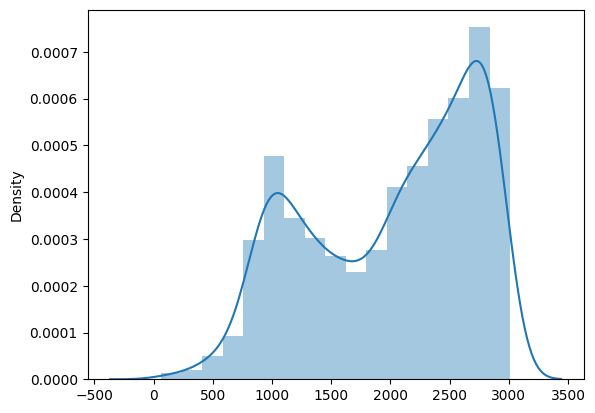

In [26]:
ica_mix_kurtosis = []
for i in range(ica.mixing_.T.shape[0]):
    curr = kurtosis(ica.mixing_.T[i])
    ica_mix_kurtosis.append(curr)

sns.distplot(ica_mix_kurtosis)

C:\Users\DKARACA\AppData\Local\Temp\ipykernel_28048\1784319308.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Kurtosis Distribution of Independent Components')]

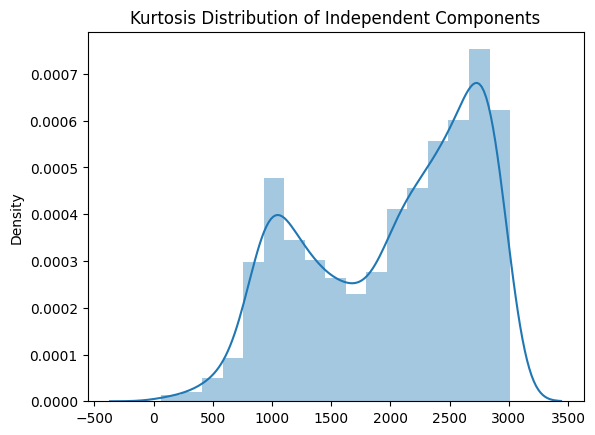

In [27]:
sns.distplot(ica_mix_kurtosis).set(title="Kurtosis Distribution of Independent Components")

In [28]:
ic_df = pd.DataFrame(ica.mixing_.T, columns=[id2term[i] for i in range(len(vect.vocabulary_))]).T
ic_descs = {}
ic_descs_neg = {}
for col in ic_df.columns.values:
    curr = sorted(list(zip(ic_df.index.tolist(), ic_df[col].tolist())), key=lambda x: x[1], reverse=True)
    ic_descs[col] = curr[:20]
    ic_descs_neg[col] = curr[-20:]

In [28]:
for i, comp in enumerate(sorted(enumerate(ica_mix_kurtosis), key=lambda x: x[1], reverse=True)):
    print(comp)
    print(ic_descs[comp[0]])
    print(ic_descs_neg[comp[0]])
    curr = ica_proj[:, comp[0]].reshape(1, -1)
    curr_sorted = sorted([(k, v) for k,v in dict(enumerate(curr[0])).items()], key=lambda x: x[1], reverse=False)
    for e in curr_sorted[:5]:
        print("{:.2f}".format(e[1]), e[0], id2textId[e[0]], text_dict[id2textId[e[0]]])
        
    for e in curr_sorted[-5:]:
        print("{:.2f}".format(e[1]), e[0], id2textId[e[0]], text_dict[id2textId[e[0]]])
    if i == 20:
        break

(1867, 3010.6671128021276)
[('time', 4.915307580940151), ('rv', 0.05312901948194816), ('install', 0.05094265220000332), ('issue', 0.04283753032276155), ('thing', 0.03937290721212636), ('make', 0.03924067360035045), ('month', 0.03679789629811574), ('leave', 0.03447571863352586), ('package', 0.03250507788613674), ('hold', 0.03235286443723325), ('order', 0.03145478952321199), ('day', 0.02950679575185914), ('ride', 0.02890080597963142), ('job', 0.027207994831146734), ('problem', 0.02714950769454013), ('quick', 0.026112967488747973), ('handy', 0.025859258286858214), ('hand', 0.025230642869142096), ('trip', 0.024642648579156965), ('easy install', 0.024379063372800915)]
[('oil', -0.0313592120459086), ('mount', -0.0315877284445029), ('wiper', -0.033356642465445265), ('lot', -0.03357029696986894), ('charger', -0.03388505715697133), ('recommend', -0.03419597562213902), ('wheel', -0.03477780401514742), ('high', -0.037363493898692535), ('battery', -0.03886527843045241), ('filter', -0.0394752439385

-0.02 5438 5453 I have this wiper in my garage ready to install when my other wiper needs to be replaced.  I was a little disturbed that the box that the wiper came in was battered, but I examined the wiper and it looked ok.  I contacted Valeo about their warranty and was shocked to hear that I had to deal with the seller (Amazon) for warranty.  Amazon offers only thirty day returns and by the time I install the wiper, the thirty days will be up.  I think Valeo, a well known wiper blade manufacturer, should handle the warranty coverage on their products beyond the thirty days offered by Amazon.  I think Amazon agrees.
-0.02 5447 5462 It is hard to find the 11" wiper blades that are used in the rear of some SUV's, this was a great find and is working really well :-)  Now all my blades are Valeo and I have no complaints about them :-)
-0.02 5426 5441 I didn't know Valeo wipers until I saw them on a deal site.  Got them on a good deal from Amazon.com.  Installed 24" & 21" wipers on my 199

In [29]:
ica_recons, comps_covered, ica_comp_lists = [], [], {}
for i, kurt in sorted(enumerate(ica_mix_kurtosis), key=lambda x: x[1], reverse=True):
    if len(comps_covered) < 500:
        print(len(comps_covered))
        comps_covered.append(i)
        curr_mixing = ica.mixing_[:, sorted(comps_covered)]
        curr_proj = ica_proj[:, sorted(comps_covered)]

        ica_comp_lists[len(comps_covered)] = comps_covered

        #ica_recons.append((len(comps_covered), np.sum((matrix - np.dot(curr_proj, curr_mixing.T)) ** 2, axis=1).mean()))
    else:
        break

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [57]:
px.line(pd.DataFrame(ica_recons, columns=['Number of Components', 'Reconstruction Error']), 
        x='Number of Components', y='Reconstruction Error', title='ICA Reconstruction Error vs Number of Components')

In [37]:
grp_recons_scores = []
for n in range(30, 510, 10):
    print(n)
    for ii in range(20):
        print(ii)
        start = time.time()
        grp = GaussianRandomProjection(n_components=n)
        grp_proj = grp.fit_transform(matrix)
        end = time.time()
        grp_recons_scores.append((n, np.sum((matrix - grp.inverse_transform(grp_proj)) ** 2, axis=1).mean(), end-start))

30
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
40
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
50
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
60
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
70
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
80
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
90
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
100
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
110
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
130
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
140
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
150
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
160
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
170
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
180
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
190
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
200
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
210
0
1
2
3
4
5
6
7
8
9
10
11
12
13

In [40]:
grp_recons_df = pd.DataFrame(grp_recons_scores, columns=['n_comps', 'reconstruction_error', 'run_time'])
grp_recons_vars = grp_recons_df.groupby("n_comps").agg({'reconstruction_error': 'var'}).reset_index().rename(columns={'reconstruction_error': 'recons_var'})

fig = px.box(grp_recons_df, x='n_comps', y='reconstruction_error', title="Random Projection Reconstruction Error across 20 Trials vs n")
fig.update_yaxes(title="Reconstruction Error")
fig.update_xaxes(title="n")
fig.show()

In [43]:
fig = px.line(grp_recons_df.groupby("n_comps").agg({'reconstruction_error': 'min'}).reset_index(), 
              x='n_comps', y='reconstruction_error', title='Random Projections Reconstruction Error vs Number of Components')
fig.show()

In [7]:
grp = GaussianRandomProjection(n_components=320)
grp_proj = grp.fit_transform(matrix)

In [9]:
fa_recons_scores = []
start = time.time()
fa = FeatureAgglomeration(n_clusters=None, distance_threshold=4, affinity='euclidean', linkage='average')
fa_proj = fa.fit_transform(matrix)
end = time.time()
#fa_recons_scores.append((n, np.sum((matrix - fa.inverse_transform(fa_proj)) ** 2, axis=1).mean(), fa.labels_, end-start))

In [10]:
grp_kmeans_scores = []
for k in range(45, 101, 5):
    clf = KMeans(n_clusters=k, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
    start_time = time.time()
    clf.fit(grp_proj)
    end_time = time.time()
    curr_sil = silhouette_score(grp_proj, clf.labels_)
    curr_dav = davies_bouldin_score(grp_proj, clf.labels_)
    curr_labels = pd.DataFrame(clf.labels_, columns=['label'])
    grp_kmeans_scores.append((k, curr_sil, curr_dav, clf.inertia_, end_time-start_time))
    print(grp_kmeans_scores[-1])

(45, 0.01745608791807389, 5.586139552772705, 17904.68677585502, 87.7009608745575)
(50, 0.020765830514925487, 5.36488782467884, 17807.710935420655, 88.22320747375488)
(55, 0.019387293418161578, 5.357511179657394, 17721.473072851808, 148.2325897216797)
(60, 0.01993235773678876, 5.279642915679424, 17630.369849255818, 123.99157738685608)
(65, 0.0219433838134044, 5.222072859402474, 17561.17036573296, 134.36533546447754)
(70, 0.021690985991454883, 5.0978244104741375, 17486.08106505442, 127.23393177986145)
(75, 0.02239909052054868, 5.101107191651447, 17422.808239524617, 145.22036147117615)
(80, 0.022967828158674562, 5.013451439491879, 17368.248043335458, 117.01836013793945)
(85, 0.021257862885390028, 5.02540091901504, 17299.882710579677, 118.78596353530884)
(90, 0.023180059753871562, 4.873621704700303, 17240.994321317314, 122.21763896942139)
(95, 0.024221466193671787, 4.846782039710599, 17178.706869691243, 132.94523644447327)
(100, 0.023401763181568943, 4.839165169638298, 17121.426209167308, 

In [11]:
fa_kmeans_scores = []
for k in range(45, 101, 5):
    clf = KMeans(n_clusters=k, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
    start_time = time.time()
    clf.fit(fa_proj)
    end_time = time.time()
    curr_sil = silhouette_score(fa_proj, clf.labels_)
    curr_dav = davies_bouldin_score(fa_proj, clf.labels_)
    curr_labels = pd.DataFrame(clf.labels_, columns=['label'])
    fa_kmeans_scores.append((k, curr_sil, curr_dav, clf.inertia_, end_time-start_time))
    print(fa_kmeans_scores[-1])

(45, 0.04405692307766669, 3.845819810746923, 7605.7993893192315, 78.00600814819336)
(50, 0.044664092212983765, 3.746716731437891, 7539.454820299292, 99.19232058525085)
(55, 0.04716870433445212, 3.674042169931196, 7452.789544414524, 99.61310935020447)
(60, 0.04330449720802029, 3.6077985848898155, 7399.105457553526, 98.82688212394714)
(65, 0.04604223378256622, 3.613943206332356, 7321.807456592768, 109.70899510383606)
(70, 0.04752471179497306, 3.564310837560232, 7258.886428968316, 119.27888488769531)
(75, 0.046627482763226764, 3.468679982796429, 7198.587644902677, 136.4777901172638)
(80, 0.043825977670576124, 3.5654973474588814, 7166.576210128733, 121.24425864219666)
(85, 0.04574704546635296, 3.5105221275471283, 7106.850024262611, 109.25529885292053)
(90, 0.04683799955679058, 3.485621406498554, 7051.6385393433275, 112.84269404411316)
(95, 0.048878440814558194, 3.4954702349761244, 7007.039522531635, 115.7411277294159)
(100, 0.05088105921093619, 3.3988688428787253, 6952.494426202803, 124.09

In [32]:
ica_kmeans_scores = []
for k in range(45, 101, 5):
    clf = KMeans(n_clusters=k, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
    start_time = time.time()
    clf.fit(ica_proj[:, sorted(ica_comp_lists[362])])
    end_time = time.time()
    curr_sil = silhouette_score(ica_proj[:, sorted(ica_comp_lists[362])], clf.labels_)
    curr_dav = davies_bouldin_score(ica_proj[:, sorted(ica_comp_lists[362])], clf.labels_)
    curr_labels = pd.DataFrame(clf.labels_, columns=['label'])
    ica_kmeans_scores.append((k, curr_sil, curr_dav, clf.inertia_, end_time-start_time))
    print(ica_kmeans_scores[-1])

(45, 0.027804963512292113, 4.055053883025955, 468.75357021797964, 59.01635026931763)
(50, -0.011509503520211514, 3.9976159048627635, 465.7697834627656, 76.59596180915833)
(55, 0.0193086737817907, 4.013271402586935, 462.73564858725655, 113.37479305267334)
(60, 0.02242607105227142, 4.131312609174746, 460.0183740828506, 114.88663458824158)
(65, 0.008910198079951049, 4.501738629707489, 456.574787773493, 116.37608981132507)
(70, 0.026171183615525687, 3.6277240430510784, 454.0490318164371, 96.58736944198608)
(75, 0.011217711923499268, 4.205924593446151, 450.51092860668325, 113.13227891921997)
(80, 0.01269810430520949, 4.1167392705947154, 447.7145950294244, 120.93234705924988)
(85, 0.022725606238420147, 3.402849805693978, 445.1800888495957, 133.46938633918762)
(90, 0.006810195961999055, 4.162069926943302, 441.7635285838233, 145.44633555412292)
(95, 0.0017678641923762472, 4.168353979977545, 439.3398311810288, 177.14774012565613)
(100, 0.006952264897447867, 4.073831311363375, 437.2127513331024,

In [33]:
pca_kmeans_scores = []
for k in range(45, 101, 5):
    clf = KMeans(n_clusters=k, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
    start_time = time.time()
    clf.fit(pca_proj[:, :200])
    end_time = time.time()
    curr_sil = silhouette_score(pca_proj[:, :200], clf.labels_)
    curr_dav = davies_bouldin_score(pca_proj[:, :200], clf.labels_)
    curr_labels = pd.DataFrame(clf.labels_, columns=['label'])
    pca_kmeans_scores.append((k, curr_sil, curr_dav, clf.inertia_, end_time-start_time))
    print(pca_kmeans_scores[-1])

(45, 0.06560483146925876, 3.0717976946537453, 5540.358242997089, 39.765867710113525)
(50, 0.06907711893605063, 3.083599031178819, 5445.909864939386, 44.66744780540466)
(55, 0.06752442945909445, 3.0093112093899577, 5365.184224799643, 51.765363693237305)
(60, 0.06837929501306231, 3.048031180561667, 5295.8780121582295, 50.64275407791138)
(65, 0.06846714332153306, 2.954518595933424, 5244.790110474818, 51.90670609474182)
(70, 0.07410503381554195, 2.888188496963376, 5165.73106731867, 52.35679340362549)
(75, 0.06866191627243086, 2.9362551260483047, 5108.4065530376, 54.66036295890808)
(80, 0.06781760720403052, 2.9628352571330874, 5048.472379379819, 65.4443130493164)
(85, 0.06726913104500302, 2.878658661485466, 5006.926476101762, 66.53787279129028)
(90, 0.07115831122864695, 2.8210442488136818, 4950.4665613459465, 65.84668326377869)
(95, 0.06636260742749917, 2.848462686110667, 4913.902402950836, 69.14837265014648)
(100, 0.06876908704240697, 2.8172624707743443, 4850.898097469802, 77.5548243522644

In [34]:
kmeans_pca = KMeans(n_clusters=70, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
kmeans_pca.fit(pca_proj[:, :200])
kmeans_ica = KMeans(n_clusters=45, init='k-means++', n_init=50, max_iter=300, 
             tol=0.0001, verbose=0, random_state=42, copy_x=True, algorithm='lloyd')
kmeans_ica.fit(ica_proj[:, sorted(ica_comp_lists[362])])

KMeans(n_clusters=45, n_init=50, random_state=42)

In [36]:
gmm_pca = GaussianMixture(n_components=70, n_init=1, max_iter=300, init_params='random_from_data')
gmm_ica = GaussianMixture(n_components=45, n_init=1, max_iter=300, init_params='random_from_data')

In [37]:
gmm_pca.fit(pca_proj[:, :200])

GaussianMixture(init_params='random_from_data', max_iter=300, n_components=70)

In [38]:
gmm_ica.fit(ica_proj[:, sorted(ica_comp_lists[362])])

GaussianMixture(init_params='random_from_data', max_iter=300, n_components=45)

In [39]:
gmm_pca_labels = gmm_pca.predict(pca_proj[:, :200])
gmm_ica_labels = gmm_ica.predict(ica_proj[:, sorted(ica_comp_lists[362])])

In [44]:
gmm_fa = GaussianMixture(n_components=45, n_init=1, max_iter=300, init_params='random_from_data')
gmm_fa.fit(fa_proj)
gmm_rp = GaussianMixture(n_components=45, n_init=1, max_iter=300, init_params='random_from_data')
gmm_rp.fit(grp_proj)

GaussianMixture(init_params='random_from_data', max_iter=300, n_components=45)

In [45]:
gmm_fa_labels = gmm_fa.predict(fa_proj)
gmm_rp_labels = gmm_rp.predict(grp_proj)

In [30]:
fa_df = pd.DataFrame(fa.labels_, columns=['term_cluster']).reset_index().rename(columns={'index': 'term_idx'})
id2term = {v:k for k,v in vect.vocabulary_.items()}
fa_df['term'] = fa_df['term_idx'].map(id2term)

fa_df = fa_df.groupby("term_cluster").agg({'term': lambda x: list(x)}).reset_index()
fa_df['ct'] = fa_df.term.map(len)

fa_df.sort_values(by='ct', ascending=False)

,term_cluster,term,ct
0,0,"[ability, abrasive, abs, absolute, absolutely,...",2665
2,2,"[duty, heavy, heavy duty]",3
3,3,"[travel, travel trailer]",2
4,4,"[battery tender, tender]",2
1,1,"[advertise, work advertise]",2
...,...,...,...
131,131,[easy],1
130,130,[quality],1
129,129,[scratch],1
128,128,[tight],1


In [46]:
plot_df = pd.read_csv("reviews_tsne_coords.csv").merge(pd.read_csv("reviews_gmm_labels.csv"), on='id_index')
plot_df = pd.concat([plot_df, 
                     pd.DataFrame(clf.labels_, columns=['fa_kmeans']),
                     pd.DataFrame(kmeans_ica.labels_, columns=['ica_kmeans']),
                     pd.DataFrame(kmeans_pca.labels_, columns=['pca_kmeans']),
                     pd.DataFrame(gmm_ica_labels, columns=['ica_gmm']),
                     pd.DataFrame(gmm_pca_labels, columns=['pca_gmm']),
                     pd.DataFrame(gmm_fa_labels, columns=['fa_gmm']),
                     pd.DataFrame(gmm_rp_labels, columns=['rp_gmm']),
                    ], axis=1)
for fig_title in [('fa_kmeans', 'FA - K-Means'), 
                 ('ica_kmeans', 'ICA - K-Means'),
                 ('pca_kmeans', 'PCA - K-Means'),
                 ('ica_gmm', 'ICA - GMM'),
                 ('pca_gmm', 'PCA - GMM'),
                 ('fa_gmm', 'FA - GMM'),
                 ('rp_gmm', 'RP - GMM')]:
    fig = px.scatter(plot_df, x='x', y='y', color=fig_title[0], title=fig_title[1])
    fig.show()